In [24]:
from imblearn.over_sampling import SMOTE
from collections import Counter
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.callbacks import EarlyStopping
# Load your dataset here (replace 'your_dataset.csv' with your actual dataset file)
data = pd.read_csv('plastic_data/15_point_showcase.csv')

# Assuming 'material_type' is the column that indicates the material type
X = data.drop(columns=['Material_Type'])
y = data['Material_Type']

In [25]:
data = data.drop([1, 2])
data.reset_index(drop=True, inplace=True)


In [26]:
data.loc[2:4, 'Material_Type'] = 'Calibration'


In [27]:
df_ref = data[(data['Material_Type'] == 'Calibration')]
df_ref

,IR_Wavelength_1,IR_Wavelength_2,IR_Wavelength_3,IR_Wavelength_4,IR_Wavelength_5,IR_Wavelength_6,IR_Wavelength_7,IR_Wavelength_8,IR_Wavelength_9,IR_Wavelength_10,IR_Wavelength_11,IR_Wavelength_12,IR_Wavelength_13,IR_Wavelength_14,IR_Wavelength_15,Material_Type
2,1884153,3544459,5442821,8387619,8387715,6785873,3570623,1737173,2577215,4374425,8308727,8387635,8276335,5206123,2666095,Calibration
3,1882283,3508831,5431159,8387341,8388061,6635885,3490497,1713547,2553225,4348277,8324207,8387849,8212751,5096739,2617855,Calibration
4,1874387,3491505,5461443,8388303,8387889,6649121,3458029,1685483,2546517,4362375,8387615,8387941,8301395,5086425,2588897,Calibration


In [28]:
df_norm = data
df_norm.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'] = data.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].div((df_ref.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].mean()))
df_norm

C:\Users\devos\AppData\Local\Temp\ipykernel_22964\1398516179.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.04496099 0.05945994 1.00206282 ... 0.7391214  0.75335124 0.7721134 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_norm.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'] = data.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].div((df_ref.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].mean()))
C:\Users\devos\AppData\Local\Temp\ipykernel_22964\1398516179.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.08065164 0.07731615 1.00840054 ... 0.64497954 0.63692988 0.64901432]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_norm.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'] = data.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].div((df_ref.loc[:, 'IR_Wavelen

,IR_Wavelength_1,IR_Wavelength_2,IR_Wavelength_3,IR_Wavelength_4,IR_Wavelength_5,IR_Wavelength_6,IR_Wavelength_7,IR_Wavelength_8,IR_Wavelength_9,IR_Wavelength_10,IR_Wavelength_11,IR_Wavelength_12,IR_Wavelength_13,IR_Wavelength_14,IR_Wavelength_15,Material_Type
0,0.044961,0.080652,0.059200,0.053785,0.046526,0.034792,0.072490,0.044792,0.068335,0.065856,0.047783,0.055476,0.044266,0.056738,0.077462,Unknown
1,0.059460,0.077316,0.056946,0.053653,0.049109,0.040038,0.074082,0.045557,0.071783,0.065826,0.046823,0.053002,0.041406,0.051367,0.064026,Unknown
2,1.002063,1.008401,0.999574,0.999984,0.999979,1.014286,1.018321,1.014664,1.007124,1.002919,0.996228,0.999979,1.001554,1.014886,1.015933,Calibration
3,1.001068,0.998264,0.997432,0.999951,1.000021,0.991868,0.995469,1.000864,0.997749,0.996924,0.998084,1.000005,0.993859,0.993562,0.997551,Calibration
4,0.996869,0.993335,1.002994,1.000065,1.000000,0.993846,0.986210,0.984472,0.995127,1.000157,1.005687,1.000016,1.004587,0.991552,0.986516,Calibration
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2571,0.777068,0.647598,0.638633,0.596765,0.533553,0.396475,0.333327,0.390075,0.688963,0.642959,0.509714,0.572262,0.436284,0.374430,0.350771,LDPE
2572,0.793653,0.663180,0.648419,0.584506,0.510377,0.382787,0.336498,0.384009,0.710439,0.653768,0.502685,0.550340,0.416154,0.365976,0.352517,LDPE
2573,0.739121,0.644980,0.676347,0.677466,0.605541,0.420859,0.332250,0.397122,0.677158,0.661617,0.558618,0.645473,0.479828,0.390074,0.356273,LDPE
2574,0.753351,0.636930,0.647046,0.642926,0.585468,0.419408,0.333614,0.397622,0.675717,0.642169,0.532306,0.617963,0.467001,0.387593,0.356565,LDPE


In [29]:
df_snv = df_norm
df_snv.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'] = df_norm.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].sub(df_norm.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].mean(axis=1), axis=0).div(df_norm.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].std(axis=1), axis=0)
df_snv

,IR_Wavelength_1,IR_Wavelength_2,IR_Wavelength_3,IR_Wavelength_4,IR_Wavelength_5,IR_Wavelength_6,IR_Wavelength_7,IR_Wavelength_8,IR_Wavelength_9,IR_Wavelength_10,IR_Wavelength_11,IR_Wavelength_12,IR_Wavelength_13,IR_Wavelength_14,IR_Wavelength_15,Material_Type
0,-0.876534,1.749412,0.171112,-0.227274,-0.761352,-1.624694,1.148945,-0.888965,0.843234,0.660844,-0.668886,-0.102900,-0.927640,-0.010002,1.514701,Unknown
1,0.234954,1.751241,0.021510,-0.258122,-0.643989,-1.414301,1.476587,-0.945618,1.281362,0.775542,-0.838145,-0.313407,-1.298094,-0.452229,0.622710,Unknown
2,-0.584606,0.271035,-0.920625,-0.865281,-0.865893,1.065667,1.610356,1.116616,0.098646,-0.468988,-1.372300,-0.865893,-0.653303,1.146596,1.287973,Calibration
3,1.276973,0.270298,-0.028464,0.875742,0.900825,-2.026281,-0.733156,1.203653,0.085218,-0.210821,0.205708,0.895175,-1.311179,-1.417814,0.014122,Calibration
4,0.114923,-0.410197,1.025089,0.589923,0.580215,-0.334276,-1.469024,-1.727221,-0.143848,0.603461,1.425313,0.582553,1.261769,-0.675197,-1.423484,Calibration
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2571,1.800725,0.872410,0.808129,0.507928,0.054696,-0.928176,-1.380954,-0.974061,1.169003,0.839150,-0.116238,0.332244,-0.642735,-1.086241,-1.255879,LDPE
2572,1.829454,0.945291,0.845263,0.412145,-0.090197,-0.954825,-1.268509,-0.946547,1.265545,0.881512,-0.142325,0.180613,-0.728712,-1.068750,-1.159958,LDPE
2573,1.347302,0.673613,0.898079,0.906088,0.391388,-0.930222,-1.564312,-1.100086,0.903884,0.792674,0.055597,0.677143,-0.508230,-1.150516,-1.392403,LDPE
2574,1.587209,0.722270,0.797427,0.766819,0.339942,-0.893786,-1.531184,-1.055644,1.010437,0.761192,-0.055022,0.581357,-0.540195,-1.130151,-1.360670,LDPE


In [30]:
df_snvScaled = df_snv
df_snvScaled.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'] = df_snv.loc[:, 'IR_Wavelength_1':'IR_Wavelength_15'].sub(-2.5).div(5)
df_snvScaled

,IR_Wavelength_1,IR_Wavelength_2,IR_Wavelength_3,IR_Wavelength_4,IR_Wavelength_5,IR_Wavelength_6,IR_Wavelength_7,IR_Wavelength_8,IR_Wavelength_9,IR_Wavelength_10,IR_Wavelength_11,IR_Wavelength_12,IR_Wavelength_13,IR_Wavelength_14,IR_Wavelength_15,Material_Type
0,0.324693,0.849882,0.534222,0.454545,0.347730,0.175061,0.729789,0.322207,0.668647,0.632169,0.366223,0.479420,0.314472,0.498000,0.802940,Unknown
1,0.546991,0.850248,0.504302,0.448376,0.371202,0.217140,0.795317,0.310876,0.756272,0.655108,0.332371,0.437319,0.240381,0.409554,0.624542,Unknown
2,0.383079,0.554207,0.315875,0.326944,0.326821,0.713133,0.822071,0.723323,0.519729,0.406202,0.225540,0.326821,0.369339,0.729319,0.757595,Calibration
3,0.755395,0.554060,0.494307,0.675148,0.680165,0.094744,0.353369,0.740731,0.517044,0.457836,0.541142,0.679035,0.237764,0.216437,0.502824,Calibration
4,0.522985,0.417961,0.705018,0.617985,0.616043,0.433145,0.206195,0.154556,0.471230,0.620692,0.785063,0.616511,0.752354,0.364961,0.215303,Calibration
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2571,0.860145,0.674482,0.661626,0.601586,0.510939,0.314365,0.223809,0.305188,0.733801,0.667830,0.476752,0.566449,0.371453,0.282752,0.248824,LDPE
2572,0.865891,0.689058,0.669053,0.582429,0.481961,0.309035,0.246298,0.310691,0.753109,0.676302,0.471535,0.536123,0.354258,0.286250,0.268008,LDPE
2573,0.769460,0.634723,0.679616,0.681218,0.578278,0.313956,0.187138,0.279983,0.680777,0.658535,0.511119,0.635429,0.398354,0.269897,0.221519,LDPE
2574,0.817442,0.644454,0.659485,0.653364,0.567988,0.321243,0.193763,0.288871,0.702087,0.652238,0.488996,0.616271,0.391961,0.273970,0.227866,LDPE


In [31]:
data = df_snvScaled 

In [32]:
# Initialize SMOTE with the desired number of samples for each class (e.g., 100)
desired_samples = 15000
smote = SMOTE(sampling_strategy={material_type: desired_samples for material_type in y.unique()})

# Apply SMOTE to the dataset
X_resampled, y_resampled = smote.fit_resample(X, y)

# Check the new class distribution
print("Class distribution after SMOTE:", Counter(y_resampled))

# Now you can use X_resampled and y_resampled as your balanced dataset

# Create a new DataFrame with the resampled data
resampled_data = pd.DataFrame(X_resampled, columns=X.columns)
resampled_data['Material_Type'] = y_resampled

# Save the resampled data to a CSV file
resampled_data.to_csv('plastic_data/test_resampled.csv', index=False)

Class distribution after SMOTE: Counter({'Unknown': 15000, 'HDPE': 15000, 'LDPE': 15000, 'PP': 15000, 'PLA': 15000, 'PET': 15000, 'PVC': 15000, 'PETG': 15000})


In [33]:
# Load the dataset
data = pd.read_csv("plastic_data/test_resampled.csv")

# Separate features and labels
X = data.drop(columns=["Material_Type"])
y = data["Material_Type"]

In [34]:
# Encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into train and test sets (Normal)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=52)

# # Normalize features
# X_train_normalized = (X_train - X_train.min()) / (X_train.max() - X_train.min())
# X_test_normalized = (X_test - X_train.min()) / (X_train.max() - X_train.min())
X_train_normalized = ((X_train - 0) / (8410000 - 0))
X_test_normalized = ((X_test - 0) / (8410000 - 0))

# Define the model architecture
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dense(len(label_encoder.classes_), activation="softmax")
])

# model = tf.keras.Sequential([
#     tf.keras.layers.Input(shape=(X_train.shape[1],)),
#     tf.keras.layers.Dense(64, activation="relu"),
#     tf.keras.layers.Dense(128, activation="relu"),
#     tf.keras.layers.Dense(128, activation="relu"),
#     tf.keras.layers.Dense(len(label_encoder.classes_), activation="softmax")
# ])

Epoch 1/5000
58/58 [==============================] - 1s 11ms/step - loss: 1.7799 - accuracy: 0.3520 - val_loss: 1.4695 - val_accuracy: 0.4728
Epoch 2/5000
58/58 [==============================] - 0s 8ms/step - loss: 1.2850 - accuracy: 0.5192 - val_loss: 1.1525 - val_accuracy: 0.5471
Epoch 3/5000
58/58 [==============================] - 0s 8ms/step - loss: 1.0698 - accuracy: 0.5844 - val_loss: 0.9964 - val_accuracy: 0.6110
Epoch 4/5000
58/58 [==============================] - 0s 8ms/step - loss: 0.9473 - accuracy: 0.6318 - val_loss: 0.8921 - val_accuracy: 0.6412
Epoch 5/5000
58/58 [==============================] - 0s 8ms/step - loss: 0.8599 - accuracy: 0.6695 - val_loss: 0.8282 - val_accuracy: 0.6746
Epoch 6/5000
58/58 [==============================] - 0s 8ms/step - loss: 0.7960 - accuracy: 0.6921 - val_loss: 0.7736 - val_accuracy: 0.6978
Epoch 7/5000
58/58 [==============================] - 0s 8ms/step - loss: 0.7450 - accuracy: 0.7111 - val_loss: 0.7198 - val_accuracy: 0.7204
Epoch

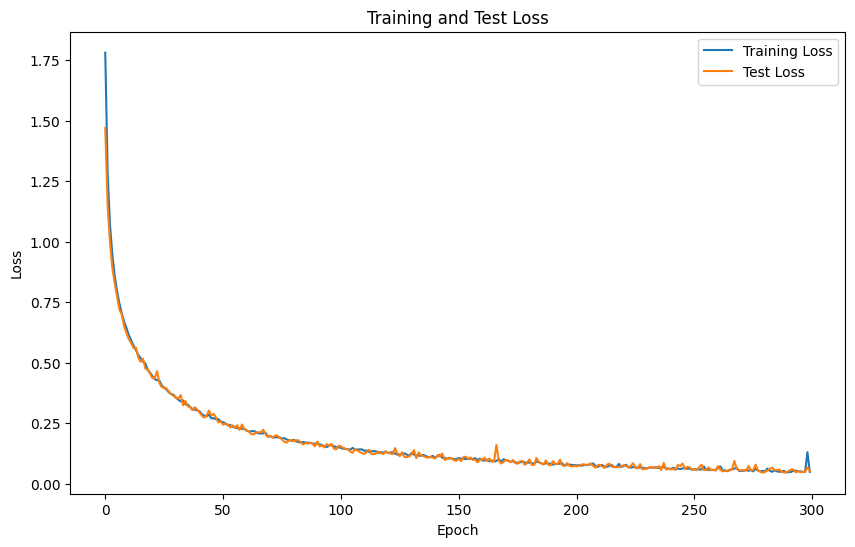

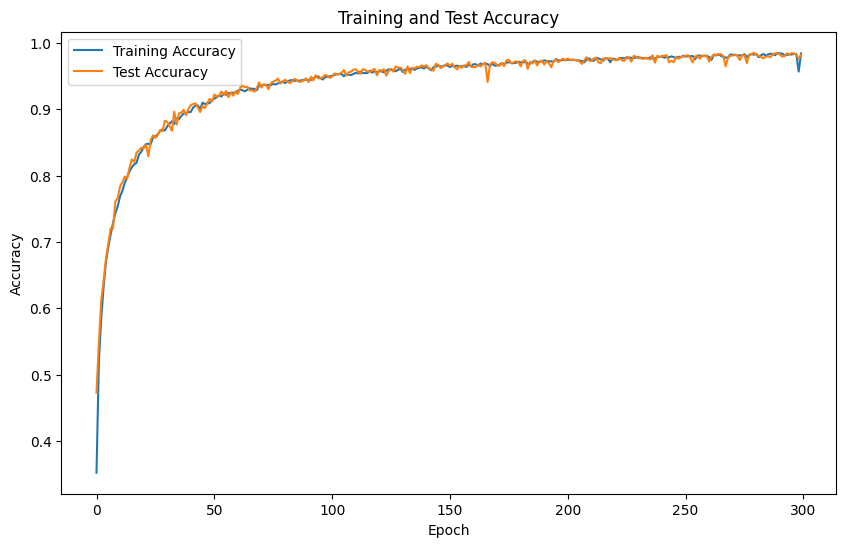

In [35]:
# Compile the model
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_normalized, y_train, epochs=5000, batch_size=1024, validation_split=0.3, callbacks=[early_stopping])

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test_normalized, y_test)

# Save the model
model.save("15_point_showcase_model.keras")

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Test Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Test Accuracy')
plt.legend()
plt.show()



In [36]:
# Make predictions
predictions = model.predict(X_test_normalized)
predicted_labels = np.argmax(predictions, axis=1)
predicted_plastic_types = label_encoder.inverse_transform(predicted_labels)



# Convert predictions to percentage likelihood
percentage_likelihood = predictions.max(axis=1) * 100

# Display test accuracy and example predictions
print(f"Test Accuracy: {test_accuracy}")
for i in range(15):
    if y_test[i] == predicted_labels[i]:
        CorF = "Correct"
    else:
        CorF = "False"
    print(f"Sample {i+1}: {CorF} Predicted {predicted_plastic_types[i]} with {percentage_likelihood[i]:.2f}% likelihood")




total_params = model.count_params()
total_size_bytes = total_params * 4  # Each parameter is usually a 32-bit float
total_size_mb = total_size_bytes / (1024)  # Convert bytes to megabytes

print(f"Total size of the model: {total_size_mb:.2f} KB")


1125/1125 [==============================] - 1s 871us/step
Test Accuracy: 0.9840278029441833
Sample 1: Correct Predicted LDPE with 99.93% likelihood
Sample 2: Correct Predicted PP with 99.96% likelihood
Sample 3: Correct Predicted LDPE with 99.94% likelihood
Sample 4: Correct Predicted Unknown with 100.00% likelihood
Sample 5: Correct Predicted PLA with 100.00% likelihood
Sample 6: Correct Predicted PVC with 90.31% likelihood
Sample 7: Correct Predicted PETG with 100.00% likelihood
Sample 8: Correct Predicted Unknown with 94.67% likelihood
Sample 9: Correct Predicted LDPE with 76.95% likelihood
Sample 10: Correct Predicted PET with 99.96% likelihood
Sample 11: Correct Predicted PETG with 100.00% likelihood
Sample 12: Correct Predicted PLA with 99.84% likelihood
Sample 13: Correct Predicted PETG with 100.00% likelihood
Sample 14: Correct Predicted PETG with 100.00% likelihood
Sample 15: Correct Predicted PET with 100.00% likelihood
Total size of the model: 402.03 KB


In [37]:
# Make predictions
predictions = model.predict(X_test_normalized)

# Get the top 4 predictions for each sample
top_predictions = np.argsort(predictions, axis=1)[:, -5:]
top_labels = top_predictions[:, ::-1]

# print(predictions)

# Reshape the top_labels array to be 1D
top_labels_1d = top_labels.reshape(-1)

# Inverse transform the labels
top_plastic_types = label_encoder.inverse_transform(top_labels_1d)

# Reshape the top_plastic_types array back to 2D
top_plastic_types = top_plastic_types.reshape(top_labels.shape)

# Get the percentage likelihoods for the top 4 predictions
percentage_likelihoods = np.take_along_axis(predictions, top_predictions, axis=1) * 100

# Display test accuracy and example predictions
print(f"Test Accuracy: {test_accuracy}")
for i in range(len(predicted_labels)):
    num_predictions = min(5, len(np.unique(top_labels[i])))
    if y_test[i] == predicted_labels[i]:
        CorF = "Correct,"
    else:
        CorF = "False,"
    print(f"Sample {i+1}: {CorF} it was {label_encoder.classes_[y_test[i]]}")
    for j in range(num_predictions):
        print(f"  Prediction {j+1}: {top_plastic_types[i][j]} with {percentage_likelihoods[i][1-j]:.2f}% likelihood") #put in '1' for HvL and '3' for the others

1125/1125 [==============================] - 1s 868us/step
Test Accuracy: 0.9840278029441833
Sample 1: Correct, it was LDPE
  Prediction 1: LDPE with 0.00% likelihood
  Prediction 2: PP with 0.00% likelihood
  Prediction 3: HDPE with 99.93% likelihood
  Prediction 4: Unknown with 0.04% likelihood
  Prediction 5: PET with 0.03% likelihood
Sample 2: Correct, it was PP
  Prediction 1: PP with 0.00% likelihood
  Prediction 2: HDPE with 0.00% likelihood
  Prediction 3: Unknown with 99.96% likelihood
  Prediction 4: PVC with 0.04% likelihood
  Prediction 5: LDPE with 0.00% likelihood
Sample 3: Correct, it was LDPE
  Prediction 1: LDPE with 0.01% likelihood
  Prediction 2: Unknown with 0.01% likelihood
  Prediction 3: HDPE with 99.94% likelihood
  Prediction 4: PVC with 0.03% likelihood
  Prediction 5: PP with 0.02% likelihood
Sample 4: Correct, it was Unknown
  Prediction 1: Unknown with 0.00% likelihood
  Prediction 2: PP with 0.00% likelihood
  Prediction 3: PVC with 100.00% likelihood
  P

In [38]:
# Get manual input from the user
manual_input = np.array([[107419, 244527, 271531,190225, 294871]])  # Replace with your input values

# Normalize the manual input if needed
normalized_manual_input = ((manual_input - 0) / (8410000 - 0))

# Make predictions on manual input
predictions = model.predict(normalized_manual_input)
print(predictions)

# Get the top prediction
top_prediction = np.argmax(predictions)
print(top_prediction)

top_plastic_type = label_encoder.inverse_transform([top_prediction])[0]
print(top_plastic_type)
likelihood = predictions[0][top_prediction] * 100

# Display the prediction for manual input
print(f"Manual Input Prediction:")
print(f"  Prediction: {top_plastic_type} with {likelihood:.2f}% likelihood")

ValueError: in user code:

    File "c:\Users\devos\Nextcloud\Projects\Plastic Scanner 2024\plastic-scanner-kyle\software\ml_model\.venv\lib\site-packages\keras\src\engine\training.py", line 2341, in predict_function  *
        return step_function(self, iterator)
    File "c:\Users\devos\Nextcloud\Projects\Plastic Scanner 2024\plastic-scanner-kyle\software\ml_model\.venv\lib\site-packages\keras\src\engine\training.py", line 2327, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\devos\Nextcloud\Projects\Plastic Scanner 2024\plastic-scanner-kyle\software\ml_model\.venv\lib\site-packages\keras\src\engine\training.py", line 2315, in run_step  **
        outputs = model.predict_step(data)
    File "c:\Users\devos\Nextcloud\Projects\Plastic Scanner 2024\plastic-scanner-kyle\software\ml_model\.venv\lib\site-packages\keras\src\engine\training.py", line 2283, in predict_step
        return self(x, training=False)
    File "c:\Users\devos\Nextcloud\Projects\Plastic Scanner 2024\plastic-scanner-kyle\software\ml_model\.venv\lib\site-packages\keras\src\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\Users\devos\Nextcloud\Projects\Plastic Scanner 2024\plastic-scanner-kyle\software\ml_model\.venv\lib\site-packages\keras\src\engine\input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential_1" is incompatible with the layer: expected shape=(None, 15), found shape=(None, 5)


In [39]:
# Make predictions from manual
manual_input = np.array([[1365889,2383139,3943193,6364119,6459881,3520279,1572135,859381,1734251,3039005,5108675,6392189,4980199,2559117,1249619
]])

# Calculate the column-wise min and max values from your original dataset
min_values = [74296, 1151721, 2379300, 2748695, 3681840, 1997402, 1742243, 942818, 392145, 795677, 1406647, 2482140, 2630495, 1748806, 1249297]
max_values = [1773075, 3755206, 7787954, 8401566, 8405071, 8401566, 7232265, 8185313, 2080604, 4455589, 8402979, 8405071, 8405071, 8403086, 6084492]

# Convert the lists to numpy arrays
min_values = np.array(min_values)
max_values = np.array(max_values)

# Normalize the manual input using the calculated min and max values
normalized_manual_input = (manual_input - min_values) / (max_values - min_values)
# normalized_manual_input = np.array([[0.85611,0.63202,0.53239,0.41068,0.59174,0.39869,0.44654,0.42188,0.8826042,0.67470967,0.34701898,0.42024683,0.34977269,0.16862726,0.1471771]])

print(normalized_manual_input)

predictions = model.predict(normalized_manual_input)
predicted_labels = np.argmax(predictions, axis=1)
predicted_plastic_types = label_encoder.inverse_transform(predicted_labels)

    
## Calculate the percentage likelihoods
percentage_likelihoods = predictions * 100

# Get the indices of the top 4 predicted classes based on percentage likelihoods
top_indices = np.argsort(percentage_likelihoods[0])[::-1][:4]

# Get the labels for the top predicted classes
top_labels = label_encoder.inverse_transform(top_indices)

# Get the predicted label
predicted_label = top_labels[0]

# Get the true label from the original data (replace with your true label)
true_label = 'ALU'  # Replace with the true label

# Calculate the accuracy
if predicted_label == true_label:
    accuracy = "Correct"
else:
    accuracy = "False"

# Print the prediction, label, and accuracy
print(f"Predicted label: {predicted_label}")
print(f"True label: {true_label}")
print(f"Accuracy: {accuracy}")

# Print the percentages for each type
for label, likelihood in zip(top_labels, percentage_likelihoods[0][top_indices]):
    print(f"{label}: {likelihood:.2f}% likelihood")

[[ 7.60306667e-01  4.72988321e-01  2.89146431e-01  6.39573059e-01
   5.88165389e-01  2.37794816e-01 -3.09849396e-02 -1.15204774e-02
   7.94870352e-01  6.12945885e-01  5.29138411e-01  6.60154407e-01
   4.06905026e-01  1.21772904e-01  6.65950391e-05]]
1/1 [==============================] - 0s 48ms/step
Predicted label: LDPE
True label: ALU
Accuracy: False
LDPE: 100.00% likelihood
PP: 0.00% likelihood
Unknown: 0.00% likelihood
PVC: 0.00% likelihood


In [ ]:
# model.save("test_model.keras")
# model.save("26_10_99p_everythingPETG.keras")

